# Problem statement - House Price Prediction

# Analytic Approach - Regression

In [76]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor


import warnings
warnings.filterwarnings('ignore')

In [77]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [78]:
df = pd.read_csv("Datasets/HousePrices.csv")

In [79]:
df.head(10)

,Id,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No

In [80]:
df.shape

(2073, 81)

In [81]:
df.columns

Index(['Id', 'Dwell_Type', 'Zone_Class', 'LotFrontage', 'LotArea', 'Road_Type',
       'Alley', 'Property_Shape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'Dwelling_Type', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCo

In [82]:
df.describe()

,Id,Dwell_Type,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Property_Sale_Price
count,2073.000000,2073.000000,1753.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2059.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,1960.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000
mean,916.132176,60.556199,72.056475,10717.853353,6.233478,5.835022,1969.445731,1986.617463,101.875668,437.949349,49.219489,565.101302,1052.270140,1166.096961,344.745779,6.168355,1517.011095,0.429329,0.056440,1.571635,0.378678,2.874096,1.052581,6.540280,0.602026,1980.418367,1.775687,474.683068,94.168837,46.035697,21.029908,2.979257,14.552340,2.299083,39.736614,6.287506,2007.851905,180967.284129
std,493.014670,159.924810,27.987475,9215.982306,1.517115,1.360214,30.222647,20.432694,179.169217,448.051119,165.621465,449.730940,431.026436,376.975119,438.844748,49.553967,517.236428,0.522605,0.237015,0.545963,0.499873,0.816144,0.237901,1.629673,0.633931,24.158327,0.741976,212.284955,129.072113,64.768713,59.569928,26.817218,54.099626,37.411031,429.819512,2.690130,1.329705,78666.411112
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1906.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,519.000000,20.000000,60.000000,7620.000000,5.000000,5.000000,1950.000000,1970.000000,0.000000,0.000000,0.000000,208.000000,794.000000,894.000000,0.000000,0.000000,1126.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1963.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,932.000000,50.000000,70.000000,9492.000000,6.000000,5.000000,1971.000000,1995.000000,0.000000,381.000000,0.000000,466.000000,990.000000,1095.000000,0.000000,0.000000,1470.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1984.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163990.000000
75%,1302.000000,70.000000,83.000000,11601.000000,7.000000,7.000000,1999.000000,2004.000000,161.500000,708.000000,0.000000,804.000000,1291.000000,1391.000000,730.000000,0.000000,1792.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2003.000000,2.000000,576.000000,168.000000,67.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1820.000000,7080.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2023.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2019.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 81 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   2073 non-null   int64  
 1   Dwell_Type           2073 non-null   int64  
 2   Zone_Class           2073 non-null   object 
 3   LotFrontage          1753 non-null   float64
 4   LotArea              2073 non-null   int64  
 5   Road_Type            2073 non-null   object 
 6   Alley                129 non-null    object 
 7   Property_Shape       2073 non-null   object 
 8   LandContour          2073 non-null   object 
 9   Utilities            2073 non-null   object 
 10  LotConfig            2073 non-null   object 
 11  LandSlope            2073 non-null   object 
 12  Neighborhood         2073 non-null   object 
 13  Condition1           2073 non-null   object 
 14  Condition2           2073 non-null   object 
 15  Dwelling_Type        2073 non-null   o

# Data Cleaning

## Filling missing values

In [84]:
df.drop('Id',axis=1,inplace=True)

In [85]:
df.isnull().sum()

Dwell_Type                0
Zone_Class                0
LotFrontage             320
LotArea                   0
Road_Type                 0
Alley                  1944
Property_Shape            0
LandContour               0
Utilities                 0
LotConfig                 0
LandSlope                 0
Neighborhood              0
Condition1                0
Condition2                0
Dwelling_Type             0
HouseStyle                0
OverallQual               0
OverallCond               0
YearBuilt                 0
YearRemodAdd              0
RoofStyle                 0
RoofMatl                  0
Exterior1st               0
Exterior2nd               0
MasVnrType               14
MasVnrArea               14
ExterQual                 0
ExterCond                 0
Foundation                0
BsmtQual                 59
BsmtCond                 59
BsmtExposure             61
BsmtFinType1             59
BsmtFinSF1                0
BsmtFinType2             60
BsmtFinSF2          

In [86]:
missing_values = df.isnull().sum()

# Calculate the missing value percentage for each column
missing_percentage = (missing_values / len(df)) * 100

# Display the result
print(missing_percentage)

Dwell_Type              0.000000
Zone_Class              0.000000
LotFrontage            15.436565
LotArea                 0.000000
Road_Type               0.000000
Alley                  93.777135
Property_Shape          0.000000
LandContour             0.000000
Utilities               0.000000
LotConfig               0.000000
LandSlope               0.000000
Neighborhood            0.000000
Condition1              0.000000
Condition2              0.000000
Dwelling_Type           0.000000
HouseStyle              0.000000
OverallQual             0.000000
OverallCond             0.000000
YearBuilt               0.000000
YearRemodAdd            0.000000
RoofStyle               0.000000
RoofMatl                0.000000
Exterior1st             0.000000
Exterior2nd             0.000000
MasVnrType              0.675350
MasVnrArea              0.675350
ExterQual               0.000000
ExterCond               0.000000
Foundation              0.000000
BsmtQual                2.846117
BsmtCond  

In [87]:
df['LotFrontage']= df['LotFrontage'].fillna(df['LotFrontage'].median())
df['LotFrontage'].isnull().sum()

0

In [88]:
print(df['Alley'].unique())

[nan 'Grvl' 'Pave']


In [89]:
df['Alley'] = df['Alley'].fillna('NA')
print(df['Alley'].unique())
df['Alley'].isnull().sum()

['NA' 'Grvl' 'Pave']


0

In [90]:
print(df['MasVnrType'].unique())

['BrkFace' 'None' 'Stone' 'BrkCmn' nan]


In [91]:
df['MasVnrType'] = df['MasVnrType'].replace(np.nan,df['MasVnrType'].mode()[0])
print(df['MasVnrType'].unique())
df['MasVnrType'].isnull().sum()

['BrkFace' 'None' 'Stone' 'BrkCmn']


0

In [92]:
df['MasVnrArea']= df['MasVnrArea'].fillna(df['MasVnrArea'].median())
df['MasVnrArea'].isnull().sum()

0

In [93]:
print(df['BsmtQual'].unique())

['Gd' 'TA' 'Ex' nan 'Fa']


In [94]:
df['BsmtQual'] = df['BsmtQual'].fillna('NA')
print(df['BsmtQual'].unique())
df['BsmtQual'].isnull().sum()

['Gd' 'TA' 'Ex' 'NA' 'Fa']


0

In [95]:
print(df['BsmtCond'].unique())

['TA' 'Gd' nan 'Fa' 'Po']


In [96]:
df['BsmtCond'] = df['BsmtCond'].fillna('NA')
print(df['BsmtCond'].unique())
df['BsmtCond'].isnull().sum()

['TA' 'Gd' 'NA' 'Fa' 'Po']


0

In [97]:
print(df['BsmtExposure'].unique())

['No' 'Gd' 'Mn' 'Av' nan]


In [98]:
df['BsmtExposure'] = df['BsmtExposure'].fillna('NA')
print(df['BsmtExposure'].unique())
df['BsmtExposure'].isnull().sum()

['No' 'Gd' 'Mn' 'Av' 'NA']


0

In [99]:
print(df['BsmtFinType1'].unique())

['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ']


In [100]:
df['BsmtFinType1'] = df['BsmtFinType1'].fillna('NA')
print(df['BsmtFinType1'].unique())
df['BsmtFinType1'].isnull().sum()

['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' 'NA' 'LwQ']


0

In [101]:
print(df['BsmtFinType2'].unique())

['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ']


In [102]:
df['BsmtFinType2'] = df['BsmtFinType2'].fillna('NA')
print(df['BsmtFinType2'].unique())
df['BsmtFinType2'].isnull().sum()

['Unf' 'BLQ' 'NA' 'ALQ' 'Rec' 'LwQ' 'GLQ']


0

In [103]:
print(df['Electrical'].unique())

['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' nan]


In [104]:
df['Electrical'] = df['Electrical'].fillna(df['Electrical'].mode()[0])
print(df['Electrical'].unique())
df['Electrical'].isnull().sum()

['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix']


0

In [105]:
print(df['FireplaceQu'].unique())

[nan 'TA' 'Gd' 'Fa' 'Ex' 'Po']


In [106]:
df['FireplaceQu'] = df['FireplaceQu'].fillna('NA')
print(df['FireplaceQu'].unique())
df['FireplaceQu'].isnull().sum()

['NA' 'TA' 'Gd' 'Fa' 'Ex' 'Po']


0

In [107]:
print(df['GarageType'].unique())

['Attchd' 'Detchd' 'BuiltIn' 'CarPort' nan 'Basment' '2Types']


In [108]:
df['GarageType'] = df['GarageType'].fillna('NA')
print(df['GarageType'].unique())
df['GarageType'].isnull().sum()

['Attchd' 'Detchd' 'BuiltIn' 'CarPort' 'NA' 'Basment' '2Types']


0

In [109]:
df['GarageYrBlt']= df['GarageYrBlt'].fillna(df['GarageYrBlt'].median())
df['GarageYrBlt'].isnull().sum()

0

In [110]:
print(df['GarageFinish'].unique())

['RFn' 'Unf' 'Fin' nan]


In [111]:
df['GarageFinish'] = df['GarageFinish'].fillna('NA')
print(df['GarageFinish'].unique())
df['GarageFinish'].isnull().sum()

['RFn' 'Unf' 'Fin' 'NA']


0

In [112]:
print(df['GarageQual'].unique())

['TA' 'Fa' 'Gd' nan 'Ex' 'Po']


In [113]:
df['GarageQual'] = df['GarageQual'].fillna('NA')
print(df['GarageQual'].unique())
df['GarageQual'].isnull().sum()

['TA' 'Fa' 'Gd' 'NA' 'Ex' 'Po']


0

In [114]:
print(df['GarageCond'].unique())

['TA' 'Fa' nan 'Gd' 'Po' 'Ex']


In [115]:
df['GarageCond'] = df['GarageCond'].fillna('NA')
print(df['GarageCond'].unique())
df['GarageCond'].isnull().sum()

['TA' 'Fa' 'NA' 'Gd' 'Po' 'Ex']


0

In [116]:
print(df['PoolQC'].unique())

[nan 'Ex' 'Fa' 'Gd']


In [117]:
df['PoolQC'] = df['PoolQC'].fillna('NA')
print(df['PoolQC'].unique())
df['PoolQC'].isnull().sum()

['NA' 'Ex' 'Fa' 'Gd']


0

In [118]:
print(df['Fence'].unique())

[nan 'MnPrv' 'GdWo' 'GdPrv' 'MnWw']


In [119]:
df['Fence'] = df['Fence'].fillna('NA')
print(df['Fence'].unique())
df['Fence'].isnull().sum()

['NA' 'MnPrv' 'GdWo' 'GdPrv' 'MnWw']


0

In [120]:
print(df['MiscFeature'].unique())

[nan 'Shed' 'Gar2' 'Othr' 'TenC']


In [121]:
df['MiscFeature'] = df['MiscFeature'].fillna('NA')
print(df['MiscFeature'].unique())
df['MiscFeature'].isnull().sum()

['NA' 'Shed' 'Gar2' 'Othr' 'TenC']


0

In [122]:
df.sample(10)

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
1642,60,RL,78.0,8016,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,6,7,1994,1994,Gable,CompShg,VinylSd,VinylSd,BrkFace,448.0,Gd,TA,PConc,Gd,TA,No,GLQ,1000,Unf,0,223,1223,GasA,Ex,Y,SBrkr,1223,904,0,2127,1,0,2,1,3,1,Gd,5,Typ,2,TA,Attchd,1994.0,RFn,2,525,TA,TA,Y,171,132,0,0,0,0,NA,NA,NA,0,8,2008,WD,Normal,271000
1000,20,RL,74.0,10206,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,1Story,3,3,1952,1952,Flat,Tar&Grv,BrkComm,Brk Cmn,None,0.0,TA,TA,Slab,NA,NA,NA,NA,0,NA,0,0,0,GasW,Fa,N,FuseF,944,0,0,944,0,0,1,0,2,1,Fa,4,Min1,0,NA,Detchd,1956.0,Unf,2,528,TA,Fa,Y,0,0,0,0,0,0,NA,NA,NA,0,7,2009,WD,Normal,82000
1327,20,RL,60.0,6600,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,9,1982,2008,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,Gd,CBlock,TA,TA,No,ALQ,641,Unf,0,175,816,GasA,Ex,Y,SBrkr,816,0,0,816,0,1,1,0,3,1,Gd,5,Typ,1,Ex,Attchd,1982.0,Unf,1,264,TA,TA,Y,0,0,0,0,0,0,NA,MnPrv,NA,0,10,2008,WD,Normal,130500
142,50,RL,71.0,8520,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,5,4,1952,1952,Gable,CompShg,BrkFace,Wd Sdng,None,0.0,TA,Fa,CBlock,TA,TA,No,Rec,507,Unf,0,403,910,GasA,Fa,Y,SBrkr,910,475,0,1385,0,0,2,0,4,1,TA,6,Typ,0,NA,Detchd,2000.0,Unf,2,720,TA,TA,Y,0,0,0,0,0,0,NA,MnPrv,NA,0,6,2010,WD,Normal,166000
178,20,RL,63.0,17423,Pave,NA,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,748.0,Ex,TA,PConc,Ex,TA,No,GLQ,1904,Unf,0,312,2216,GasA,Ex,Y,SBrkr,2234,0,0,2234,1,0,2,0,1,1,Ex,9,Typ,1,Gd,Attchd,2009.0,Fin,3,1166,TA,TA,Y,0,60,0,0,0,0,NA,NA,NA,0,7,2009,New,Partial,501837
1102,20,RL,70.0,7000,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1960,2002,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,30.0,TA,TA,CBlock,TA,TA,No,Rec,588,Unf,0,422,1010,GasA,Ex,Y,SBrkr,1134,0,0,1134,0,0,1,0,2,1,TA,6,Typ,0,NA,Attchd,1960.0,RFn,1,254,TA,TA,Y,0,16,0,0,0,0,NA,MnWw,NA,0,4,2007,WD,Family,135000
582,90,RL,81.0,11841,Grvl,NA,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,SFoyer,6,5,1990,1990,Gable,CompShg,HdBoard,HdBoard,BrkFace,104.0,TA,Gd,CBlock,Gd,TA,Av,GLQ,816,Unf,0,0,816,GasA,TA,Y,SBrkr,816,0,0,816,1,0,1,0,3,1,TA,5,Typ,0,NA,NA,1984.0,NA,0,0,NA,NA,Y,0,32,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,118500
17,90,RL,72.0,10791,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Slab,NA,NA,NA,NA,0,NA,0,0,0,GasA,TA,Y,SBrkr,1296,0,0,1296,0,0,2,0,2,2,TA,6,Typ,0,NA,CarPort,1967.0,Unf,2,516,TA,TA,Y,0,0,0,0,0,0,NA,NA,Shed,500,10,2006,WD,Normal,90000
1770,160,FV,24.0,8028,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,Twnhs,2Story,6,7,1935,1999,Gable,CompShg,MetalSd,MetalSd,BrkFace,360.0,TA,TA,PConc,Gd,TA,No,ALQ,549,Unf,0,195,744,GasA,Gd,Y,SBrkr,757,744,0,1501,0,0,2,1,3,1,TA,6,Typ,0,NA,Detchd,1999.0,Unf,2,440,TA,TA,Y,0,0,0,0,0,0,NA,NA,NA,0,8,2008,WD,Normal,179400
1906,20,RH,60.0,7800,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,9,1936,1965,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,641,Unf,0,187,828,GasA,Gd,Y,SBrkr,965,0,0,965,1,0,1,0,3,1,TA,6,Typ,0,NA,Detchd,1979.0

## Checking coorelation

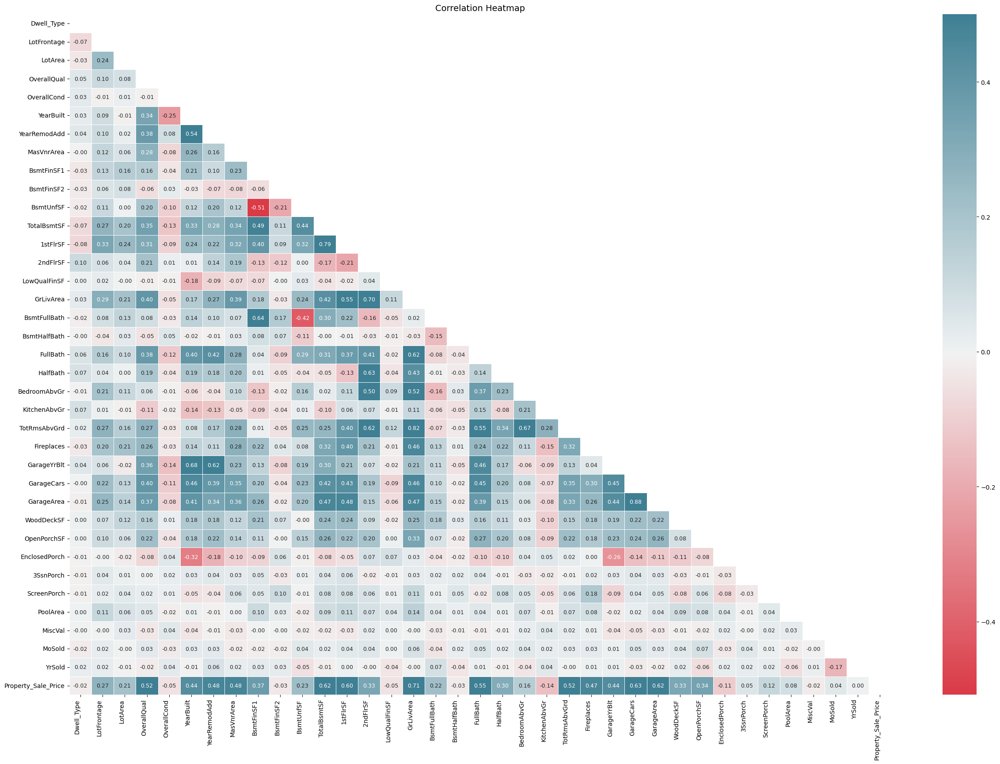

In [123]:
plt.figure(figsize=(30, 20))  # Set the figure size
colormap = sns.diverging_palette(10, 220, as_cmap = True)

# Create a mask for the upper triangle
corr_matrix = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, mask=mask, cmap=colormap, annot=True, fmt=".2f", linewidths=0.5, vmax=0.5, annot_kws={'fontsize':9})
plt.title('Correlation Heatmap', fontsize=14)
plt.xticks(rotation=90, ha='right')  # Rotate x-axis labels for better visibility
plt.yticks(rotation=0)
plt.show()

In [124]:
correlation_matrix = df.corr()

# Extract the correlations of each column with the target variable
correlations = correlation_matrix['Property_Sale_Price'].abs().sort_values(ascending=False).round(2)

# Display the correlations in decreasing order
print(correlations)

Property_Sale_Price    1.00
GrLivArea              0.71
GarageCars             0.63
GarageArea             0.62
TotalBsmtSF            0.62
1stFlrSF               0.60
FullBath               0.55
TotRmsAbvGrd           0.52
OverallQual            0.52
MasVnrArea             0.48
YearRemodAdd           0.48
Fireplaces             0.47
GarageYrBlt            0.44
YearBuilt              0.44
BsmtFinSF1             0.37
OpenPorchSF            0.34
2ndFlrSF               0.33
WoodDeckSF             0.33
HalfBath               0.30
LotFrontage            0.27
BsmtUnfSF              0.23
BsmtFullBath           0.22
LotArea                0.21
BedroomAbvGr           0.16
KitchenAbvGr           0.14
ScreenPorch            0.12
EnclosedPorch          0.11
PoolArea               0.08
3SsnPorch              0.05
OverallCond            0.05
LowQualFinSF           0.05
MoSold                 0.04
BsmtFinSF2             0.03
BsmtHalfBath           0.03
MiscVal                0.02
Dwell_Type          

In [125]:
threshold = 0.3

# Find the columns to drop
columns_to_drop = correlation_matrix.columns[correlation_matrix['Property_Sale_Price'].abs() < threshold]

# Drop the columns from the DataFrame
df_dropped = df.drop(columns_to_drop, axis=1)

# Display the resulting DataFrame
df_dropped.shape #19 columns removed

(2073, 61)

In [126]:
df_dropped.head()

,Zone_Class,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,Property_Sale_Price
0,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,856,GasA,Ex,Y,SBrkr,856,854,1710,2,Gd,8,Typ,0,NA,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,NA,NA,NA,WD,Normal,208500
1,RL,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,1262,GasA,Ex,Y,SBrkr,1262,0,1262,2,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,NA,NA,NA,WD,Normal,181500
2,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,920,GasA,Ex,Y,SBrkr,920,866,1786,2,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,NA,NA,NA,WD,Normal,223500
3,RL,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,756,GasA,Gd,Y,SBrkr,961,756,1717,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,NA,NA,NA,WD,Abnorml,140000
4,RL,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,2,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,NA,NA,NA,WD,Normal,250000


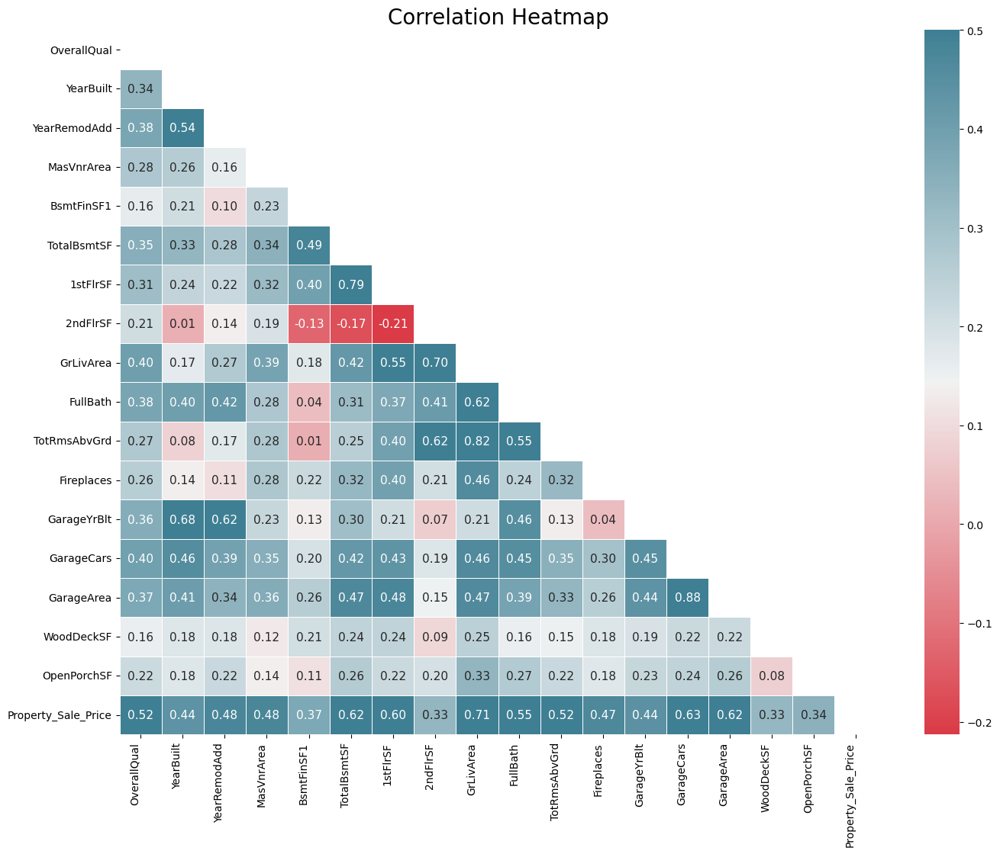

In [127]:
plt.figure(figsize=(16, 12))  # Set the figure size
colormap = sns.diverging_palette(10, 220, as_cmap = True)

# Create a mask for the upper triangle
corr_matrix = df_dropped.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, mask=mask, cmap=colormap, annot=True, fmt=".2f", linewidths=0.5, vmax=0.5, annot_kws={'fontsize':11})
plt.title('Correlation Heatmap', fontsize=20)
plt.xticks(rotation=90, ha='right')  # Rotate x-axis labels for better visibility
plt.yticks(rotation=0)
plt.show()

# Checking distribution of data

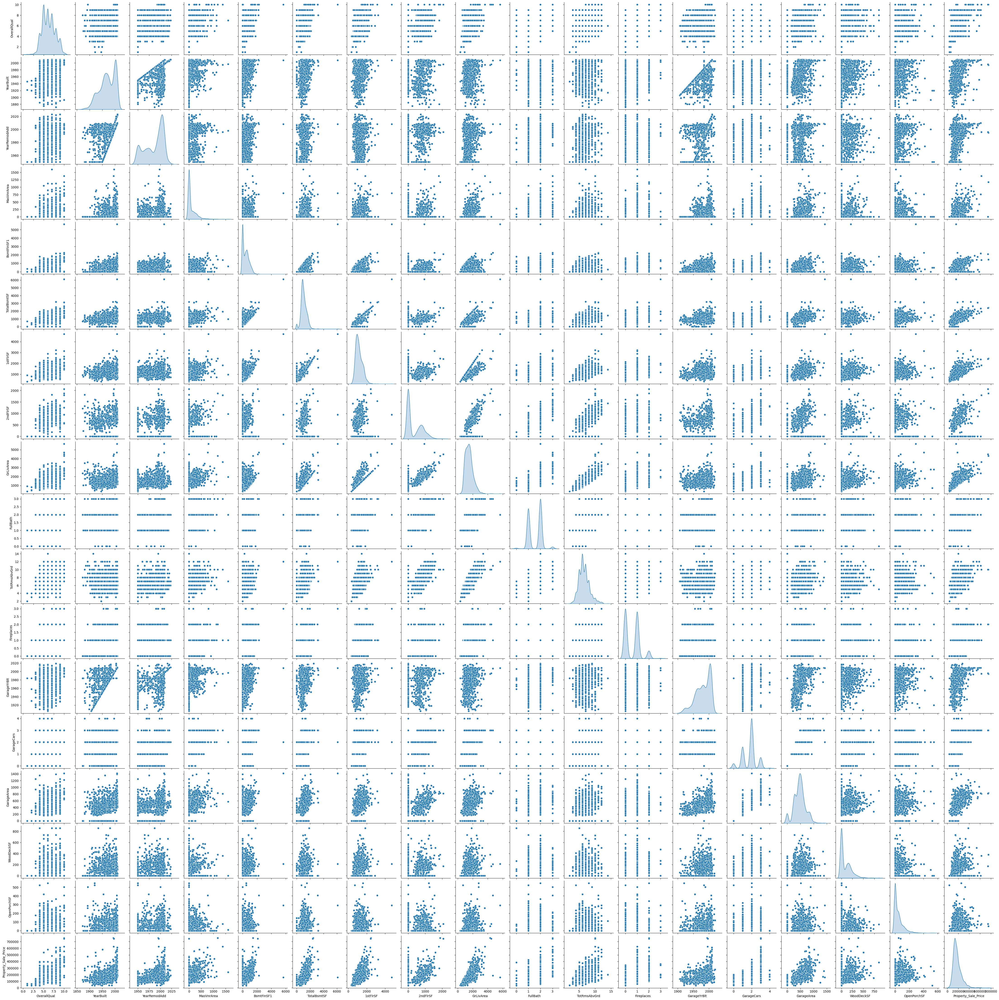

In [53]:
sns.pairplot(df_dropped,diag_kind='kde')

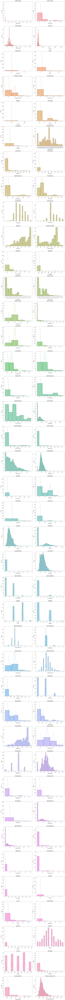

In [54]:
# Determine the number of rows and columns for the subplot grid
num_columns = 2  # Number of columns for the subplot grid
num_rows = -(-len(df.columns) // num_columns)  # Round up the division result to the nearest integer

colors = sns.color_palette('husl', df.shape[1])

# Create a figure and axes for the subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(18,275))

# Flatten the axes array for ease of iteration
axes = axes.flatten()

# Iterate over the columns and create histplot with KDE
for i, column in enumerate(df.columns):
    ax = axes[i] if i < len(axes) else None  # Handle cases where there are more columns than subplots
    if ax is not None:
        sns.histplot(data=df, x=column, kde=True, color=colors[i], line_kws={'color': 'black'}, ax=ax)
        ax.set_title(column,fontsize=20)
        
        ax.set_xticklabels(ax.get_xticklabels(), rotation=55,fontsize=11)
        ax.set_yticklabels(ax.get_yticklabels(),fontsize=11)
        ax.set_xlabel(column,fontsize=15)
        ax.set_ylabel('Count',fontsize=15)
        
# Remove any unused subplots
if len(df.columns) < len(axes):
    for j in range(len(df.columns), len(axes)):
        fig.delaxes(axes[j])

# Adjust the layout of subplots and spacing
plt.tight_layout()

# Display the subplots
plt.show()

# Checking count of each categorical columns

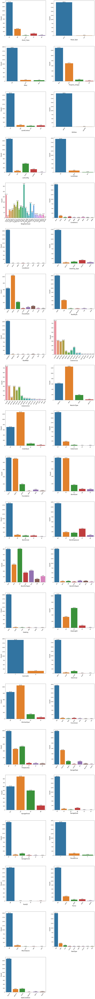

In [55]:

# Select the categorical columns from the DataFrame
categorical_columns = df.select_dtypes(include='object').columns

# Determine the number of rows and columns for the subplot grid
num_columns = 2  # Number of columns for the subplot grid
num_rows = -(-len(categorical_columns) // num_columns)  # Round up the division result to the nearest integer

# Create a figure and axes for the subplots figsize=(15, 300)
fig, axes = plt.subplots(num_rows, num_columns, figsize=(18,200))

# Flatten the axes array for ease of iteration
axes = axes.flatten()

# Iterate over the categorical columns and create countplots
for i, column in enumerate(categorical_columns):
    ax = axes[i] if i < len(axes) else None  # Handle cases where there are more columns than subplots
    if ax is not None:
        # Calculate value counts for the current column
        value_counts = df[column].value_counts()

        # Create a countplot for the column
        sns.countplot(data=df, x=column, ax=ax)

        # Calculate the value percentages
        total_count = value_counts.sum()
        value_percentages = value_counts / total_count * 100

        # Add value percentage text to the countplot
        for j, p in enumerate(ax.patches):
            ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 5, f"{value_percentages[j]:.1f}%", ha='center',fontsize=10)
        
        #ax.set_title(column,fontsize=20)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=55,fontsize=11)
        ax.set_yticklabels(ax.get_yticklabels(),fontsize=11)
        ax.set_xlabel(column,fontsize=15)
        ax.set_ylabel('Count',fontsize=15)
        
if len(categorical_columns) < len(axes):
    for j in range(len(categorical_columns), len(axes)):
        fig.delaxes(axes[j])        
        
# Adjust the layout of subplots and spacing
fig.subplots_adjust(hspace=0.3)

# Display the subplots
plt.show()

# Standardization

In [128]:
std = StandardScaler()

cols = ['OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'FullBath',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF']

for i in cols:
    df_dropped[i] = std.fit_transform(df_dropped[[i]])

# Encoding

In [129]:
df_dropped = pd.get_dummies(df_dropped)

In [130]:
df_dropped.dtypes

OverallQual              float64
YearBuilt                float64
YearRemodAdd             float64
MasVnrArea               float64
BsmtFinSF1               float64
TotalBsmtSF              float64
1stFlrSF                 float64
2ndFlrSF                 float64
GrLivArea                float64
FullBath                 float64
TotRmsAbvGrd             float64
Fireplaces               float64
GarageYrBlt              float64
GarageCars               float64
GarageArea               float64
WoodDeckSF               float64
OpenPorchSF              float64
Property_Sale_Price        int64
Zone_Class_C (all)         uint8
Zone_Class_FV              uint8
Zone_Class_RH              uint8
Zone_Class_RL              uint8
Zone_Class_RM              uint8
Road_Type_Grvl             uint8
Road_Type_Pave             uint8
Alley_Grvl                 uint8
Alley_NA                   uint8
Alley_Pave                 uint8
Property_Shape_IR1         uint8
Property_Shape_IR2         uint8
Property_S

In [131]:
df_dropped.shape

(2073, 284)

# Model building

In [60]:
X1 = df_dropped.drop('Property_Sale_Price',axis=1)
y1 = df_dropped['Property_Sale_Price']

X_train,X_test,y_train,y_test = train_test_split(X1,y1,test_size=0.3,random_state=0)

# Linear Regression

In [61]:
model_1 = LinearRegression()

model_1.fit(X_train,y_train)

print('train - ', model_1.score(X_train,y_train))
print('test - ', model_1.score(X_test,y_test))

train -  0.9364063051845938
test -  -1.4760964712734108e+18


# Decision Tree Regressor

In [62]:
model_2 = DecisionTreeRegressor()
model_2.fit(X_train,y_train)

print('train - ', model_2.score(X_train,y_train))
print('test - ', model_2.score(X_test,y_test))

train -  1.0
test -  0.8142158624560674


In [63]:
model_2 = DecisionTreeRegressor(max_depth=5)
model_2.fit(X_train,y_train)

print('train - ', model_2.score(X_train,y_train))
print('test - ', model_2.score(X_test,y_test))

train -  0.8688555033928219
test -  0.7759447574481215


In [64]:
model_2 = DecisionTreeRegressor(criterion="friedman_mse",max_depth=7)
model_2.fit(X_train,y_train)

print('train - ', model_2.score(X_train,y_train))
print('test - ', model_2.score(X_test,y_test))

train -  0.9401337109741736
test -  0.76073292685509


# Random Forest Regressor

In [65]:
model_3 = RandomForestRegressor()
model_3.fit(X_train,y_train)

print('train - ', model_3.score(X_train,y_train))
print('test - ', model_3.score(X_test,y_test))

train -  0.9861304496821331
test -  0.9121775821220992


In [66]:
model_3 = RandomForestRegressor(n_estimators=101,criterion='friedman_mse', max_depth= 9)
model_3.fit(X_train,y_train)

print('train - ', model_3.score(X_train,y_train))
print('test - ', model_3.score(X_test,y_test))

train -  0.9745849013033197
test -  0.9067787855597976


In [67]:
model_3 = RandomForestRegressor(n_estimators=101,criterion='absolute_error', max_depth= 10)
model_3.fit(X_train,y_train)

print('train - ', model_3.score(X_train,y_train))
print('test - ', model_3.score(X_test,y_test))

train -  0.9792648294248283
test -  0.9111949010465851


In [68]:
model_3 = RandomForestRegressor(n_estimators=100,criterion='friedman_mse', max_depth= 15)
model_3.fit(X_train,y_train)

print('train - ', model_3.score(X_train,y_train))
print('test - ', model_3.score(X_test,y_test))

train -  0.9856721749491588
test -  0.9128623895953037


In [69]:
model_3 = RandomForestRegressor(n_estimators=80,criterion='absolute_error', max_depth=15)
model_3.fit(X_train,y_train)

print('train - ', model_3.score(X_train,y_train))
print('test - ', model_3.score(X_test,y_test))

train -  0.9843644143144146
test -  0.9160656622370564


# Scores of models :

### 1. Linear Regression : train = 0.97, test =  -1.47

### 2. Decision Tree Regression : train = 0.87, test =  0.77

### 3. Random Forest Regression : train = 0.97, test =  0.91


### Interpretation : Random forest regressor model yeilds high score compared to other regressor models



# PCA 

In [132]:
from sklearn.decomposition import PCA

In [133]:
df_dropped['Property_Sale_Price'] = std.fit_transform(df_dropped[['Property_Sale_Price']])

In [134]:
X1 = df_dropped.drop('Property_Sale_Price',axis=1)
y1 = df_dropped['Property_Sale_Price']

In [135]:
covMatrix = np.cov(X1,rowvar=False)
print(covMatrix)

[[ 1.00048263e+00  3.35488146e-01  3.79762315e-01 ... -2.10120688e-03
  -3.77844243e-02  6.33662228e-02]
 [ 3.35488146e-01  1.00048263e+00  5.36387289e-01 ... -3.90851816e-03
  -4.96039187e-02  7.98163068e-02]
 [ 3.79762315e-01  5.36387289e-01  1.00048263e+00 ... -5.26431422e-03
  -3.85953405e-02  8.25477668e-02]
 ...
 [-2.10120688e-03 -3.90851816e-03 -5.26431422e-03 ...  1.14489101e-02
  -9.47091396e-03 -9.77822975e-04]
 [-3.77844243e-02 -4.96039187e-02 -3.85953405e-02 ... -9.47091396e-03
   1.49166895e-01 -6.90587476e-02]
 [ 6.33662228e-02  7.98163068e-02  8.25477668e-02 ... -9.77822975e-04
  -6.90587476e-02  7.73295003e-02]]


In [146]:
pca = PCA(n_components=10)
pca.fit(X1)

PCA(n_components=10)

In [147]:
print(pca.explained_variance_)

[7.41396461 2.61099619 2.37762082 1.13948511 1.12584276 0.99890343
 0.92784898 0.89711104 0.778668   0.74515338]


In [148]:
print(pca.components_)

[[ 0.22138918  0.23607462  0.2305614  ... -0.00123936 -0.02030893
   0.03585504]
 [ 0.01455066 -0.24908771 -0.13131409 ...  0.00052192  0.02152557
  -0.02195055]
 [-0.03430051 -0.19344025 -0.26726209 ...  0.00323252  0.01105027
  -0.02511122]
 ...
 [ 0.08323207 -0.08763384 -0.01916762 ... -0.00421937  0.01694474
  -0.00467534]
 [ 0.52120809 -0.27504412  0.16368248 ...  0.00078016 -0.01230137
   0.01595736]
 [-0.10296454 -0.07746224 -0.00408113 ...  0.00054977 -0.03039598
   0.0242253 ]]


In [149]:
print(pca.explained_variance_ratio_)

[0.2301992  0.08106988 0.07382372 0.03538034 0.03495675 0.03101536
 0.02880916 0.02785477 0.02417718 0.02313657]


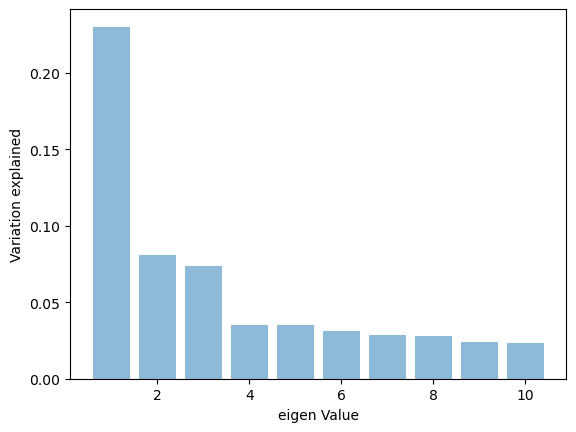

In [151]:
plt.bar(list(range(1,11)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

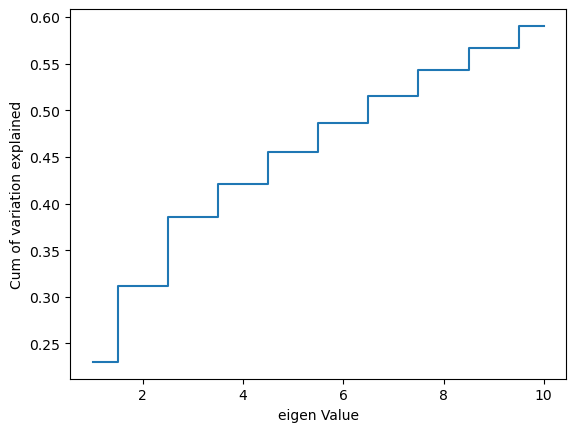

In [152]:
plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [153]:
pca3 = PCA(n_components=10)
pca3.fit(X1)
print(pca3.components_)
print(pca3.explained_variance_ratio_)
Xpca3 = pca3.transform(X1)

[[ 0.22138918  0.23607462  0.2305614  ... -0.00123936 -0.02030893
   0.03585504]
 [ 0.01455065 -0.24908771 -0.13131408 ...  0.00052192  0.02152556
  -0.02195055]
 [-0.03430052 -0.19344022 -0.26726208 ...  0.00323252  0.01105025
  -0.02511121]
 ...
 [ 0.08324466 -0.08764658 -0.01917821 ... -0.00422036  0.01696788
  -0.0046945 ]
 [ 0.52112602 -0.27492285  0.16376097 ...  0.00077902 -0.01235401
   0.0160459 ]
 [-0.10307812 -0.07693872 -0.00399576 ...  0.00055609 -0.03062788
   0.02439678]]
[0.2301992  0.08106988 0.07382372 0.03538034 0.03495675 0.03101536
 0.02880916 0.02785477 0.02417717 0.02313651]


In [154]:
Xpca3

array([[ 2.11585277,  0.25318317, -2.4466548 , ...,  0.49875289,
        -0.05709481, -0.97456658],
       [ 0.1444099 , -1.10953036,  1.40301852, ..., -0.37626732,
        -0.31560652, -0.54686629],
       [ 2.40786934,  0.15054666, -1.89836202, ...,  0.23536392,
        -0.2524499 , -0.94141396],
       ...,
       [ 0.1125574 , -0.80051641,  0.3213865 , ..., -2.04016462,
        -1.85623533, -0.30939848],
       [ 0.05852594,  0.44848993,  1.69278109, ...,  0.58207945,
         0.28575459,  1.66454074],
       [-1.16519124,  1.17049422,  1.02093751, ...,  1.13181364,
         2.97212171, -1.2205619 ]])

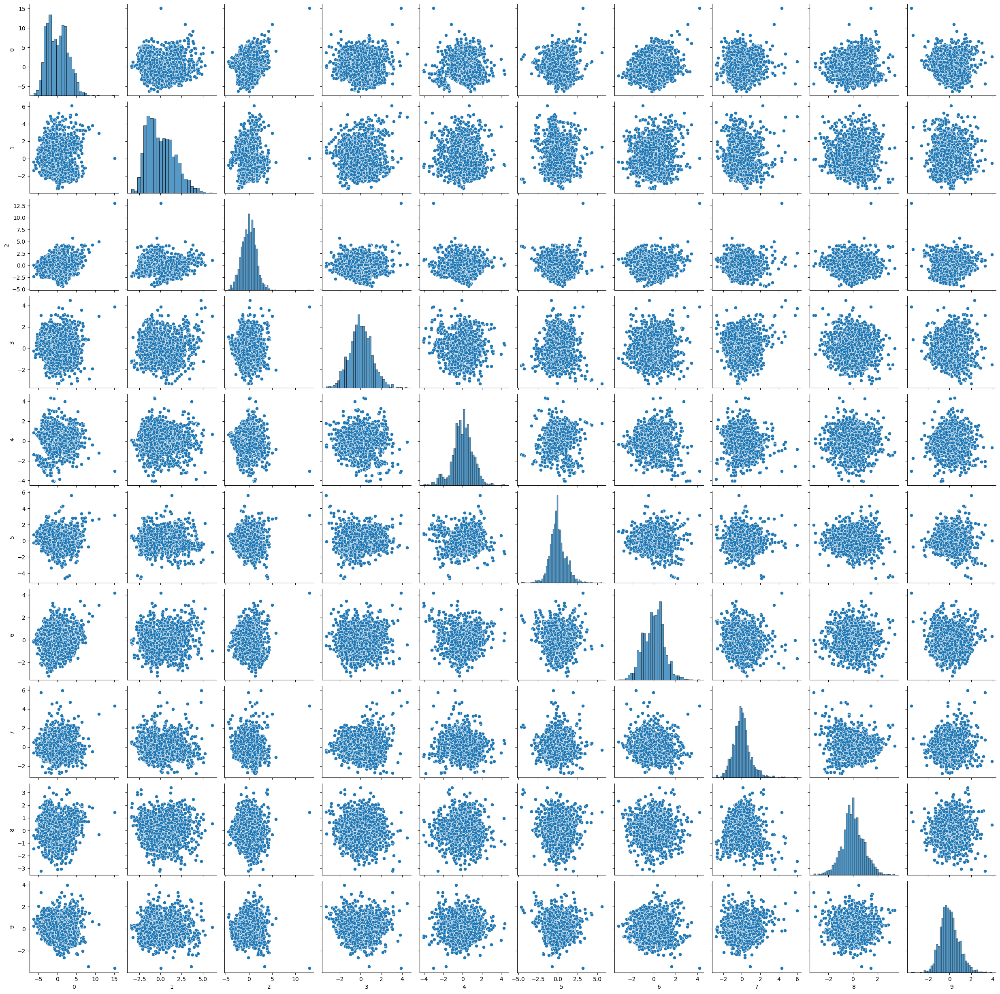

In [155]:
sns.pairplot(pd.DataFrame(Xpca3))


In [158]:
regression_model_pca = LinearRegression()
regression_model_pca.fit(Xpca3, y1)
regression_model_pca.score(Xpca3, y1)

0.7826251696864114

In [159]:
X_train,X_test,y_train,y_test = train_test_split(X1,y1,test_size=0.3,random_state=0)

In [160]:
covMatrix = np.cov(X_train,rowvar=False)
print(covMatrix)

[[ 1.00873022e+00  3.35076077e-01  3.76277473e-01 ... -3.70711001e-03
  -3.32784414e-02  6.29325011e-02]
 [ 3.35076077e-01  1.00975599e+00  5.36930103e-01 ... -3.03243908e-03
  -4.72779994e-02  7.70630612e-02]
 [ 3.76277473e-01  5.36930103e-01  9.89432594e-01 ... -4.60666865e-03
  -4.04759325e-02  8.01371881e-02]
 ...
 [-3.70711001e-03 -3.03243908e-03 -4.60666865e-03 ...  1.02378859e-02
  -8.51968916e-03 -8.34145298e-04]
 [-3.32784414e-02 -4.72779994e-02 -4.04759325e-02 ... -8.51968916e-03
   1.45402695e-01 -6.64535754e-02]
 [ 6.29325011e-02  7.70630612e-02  8.01371881e-02 ... -8.34145298e-04
  -6.64535754e-02  7.41833218e-02]]


In [161]:
pca = PCA(n_components=10)
pca.fit(X_train)

PCA(n_components=10)

In [162]:
print(pca.explained_variance_)

[7.65220887 2.59144013 2.34168678 1.18111664 1.12353985 1.00759163
 0.95012617 0.89076495 0.77769872 0.7222588 ]


In [163]:
print(pca.components_)

[[ 0.22347881  0.23167719  0.22496955 ... -0.00084432 -0.02132703
   0.03627368]
 [ 0.03393175 -0.24772272 -0.11981927 ...  0.0006341   0.02281264
  -0.02082126]
 [-0.02520518 -0.22336561 -0.26583862 ...  0.00298482 -0.00073447
  -0.01643336]
 ...
 [ 0.09835735 -0.13817293  0.01667271 ... -0.00686795  0.00323236
   0.00863126]
 [ 0.27383689 -0.22432324  0.1335894  ... -0.001606   -0.01786553
   0.02124338]
 [-0.4515462   0.0966453  -0.13685176 ...  0.00342981  0.0115358
  -0.00647674]]


In [164]:
print(pca.explained_variance_ratio_)

[0.23572666 0.07982944 0.07213577 0.03638435 0.0346107  0.03103891
 0.02926868 0.02744006 0.02395705 0.02224922]


In [170]:
pca3 = PCA(n_components=10)
pca3.fit(X_train)
print(pca3.components_)
print(pca3.explained_variance_ratio_)
Xpca3 = pca3.transform(X_train)

[[ 0.22347881  0.23167719  0.22496955 ... -0.00084432 -0.02132703
   0.03627368]
 [ 0.03393175 -0.24772271 -0.11981927 ...  0.0006341   0.02281263
  -0.02082126]
 [-0.02520519 -0.22336558 -0.26583863 ...  0.00298482 -0.00073449
  -0.01643335]
 ...
 [ 0.09834066 -0.13815349  0.01664774 ... -0.00686783  0.00322219
   0.00864272]
 [ 0.27390163 -0.22456793  0.13357798 ... -0.00161825 -0.01775705
   0.02121139]
 [-0.45154897  0.0965173  -0.13688206 ...  0.00342408  0.01157285
  -0.00648618]]
[0.23572666 0.07982944 0.07213577 0.03638435 0.0346107  0.03103891
 0.02926868 0.02744005 0.02395706 0.0222492 ]


In [171]:
pca3 = PCA(n_components=10)
pca3.fit(X_test)
print(pca3.components_)
print(pca3.explained_variance_ratio_)
Xpca4 = pca3.transform(X_test)

[[ 2.15848381e-01  2.47292425e-01  2.45310312e-01 ... -2.29480034e-03
  -1.77025242e-02  3.48896918e-02]
 [-3.55003266e-02 -2.51129793e-01 -1.75901204e-01 ... -6.85289812e-05
   2.55037635e-02 -3.07069389e-02]
 [-3.87813268e-02 -1.09176223e-01 -2.39034282e-01 ...  3.39029939e-03
   3.35999459e-02 -3.88722937e-02]
 ...
 [-4.25193147e-01  3.81624236e-02 -1.36868137e-02 ... -4.83368087e-03
  -2.30383898e-02  2.17302237e-03]
 [ 3.61272924e-01 -2.20378014e-01  5.05659879e-02 ...  6.68600675e-03
   5.30763763e-02 -3.65038472e-02]
 [ 3.77072806e-01 -1.64828278e-01  4.62262080e-02 ...  7.52597092e-03
  -1.06525367e-01  6.53443845e-02]]
[0.21833541 0.08525905 0.08031966 0.03681985 0.03338646 0.03191362
 0.0302738  0.02873237 0.02624321 0.02306829]


In [172]:
regression_model_pca = LinearRegression()
regression_model_pca.fit(Xpca3, y_train)
regression_model_pca.score(Xpca3, y_train)

0.7722833777978839

In [173]:
regression_model_pca.score(Xpca4, y_test)

0.7765391780172838